In [244]:
from sklearn.datasets import load_boston
from sklearn.linear_model import LinearRegression
import numpy as np
from pandas_profiling import ProfileReport
import pandas as pd
import matplotlib.pyplot as plt 

X, y = load_boston(return_X_y=True)
print(X.shape)
data = load_boston()
regression = LinearRegression()


(506, 13)


In [245]:
data.feature_names

array(['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD',
       'TAX', 'PTRATIO', 'B', 'LSTAT'], dtype='<U7')

In [246]:
df = pd.DataFrame(data.data, columns = data.feature_names)

In [247]:
ProfileReport(df)

In [248]:
#### Create baseline model 

In [249]:
data.DESCR.split("\n")

['.. _boston_dataset:',
 '',
 'Boston house prices dataset',
 '---------------------------',
 '',
 '**Data Set Characteristics:**  ',
 '',
 '    :Number of Instances: 506 ',
 '',
 '    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.',
 '',
 '    :Attribute Information (in order):',
 '        - CRIM     per capita crime rate by town',
 '        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.',
 '        - INDUS    proportion of non-retail business acres per town',
 '        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)',
 '        - NOX      nitric oxides concentration (parts per 10 million)',
 '        - RM       average number of rooms per dwelling',
 '        - AGE      proportion of owner-occupied units built prior to 1940',
 '        - DIS      weighted distances to five Boston employment centres',
 '        - RAD      index of accessibility to radial highways

In [250]:
model = regression.fit(df, y)

In [251]:
y_pred = model.predict(X)

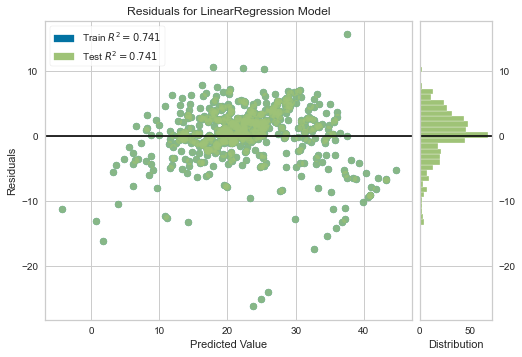

In [252]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import Ridge
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import ResidualsPlot


visualizer = ResidualsPlot(model)

visualizer.fit(df, y)  # Fit the training data to the visualizer
visualizer.score(df, y)  # Evaluate the model on the test data
visualizer.show()  

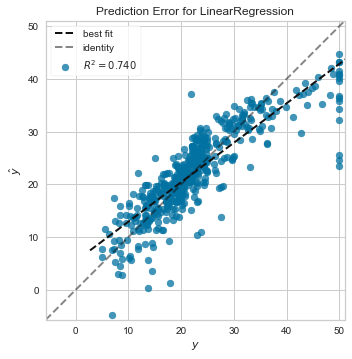

In [287]:
from yellowbrick.datasets import load_concrete
from yellowbrick.regressor import PredictionError
visualizer = PredictionError(model)
visualizer.fit(df, y)  # Fit the training data to the visualizer
visualizer.score(df, y)  # Evaluate the model on the test data
visualizer.show() 

In [255]:
baseline_model = model

In [256]:
baseline_model.score(df, y)

0.7406426641094095

#### Step 2:
lest select age column 

In [260]:
#df.loc[df.sample(frac=0.1).index, col] = pd.np.nan

In [261]:
## impute with 0

In [288]:
def get_imputed_sample_random(d, frac, cols):
    print("getting data for col {} and fraction {}".format(cols, frac))
    d = load_boston()
    data_frame = pd.DataFrame(d.data, columns = data.feature_names)
    data_frame.loc[data_frame.sample(frac=frac).index, cols] = np.nan
    data_frame.loc[data_frame[cols].isna().index, cols]= 0 
    return data_frame

#### Question 2: In each case [1%, 5%, 10%, 20%, 33%, 50%] perform a fit with the imputed data and compare the loss and goodness of fit to your baseline.  

In [263]:
#1%, 5% 10%, 20%, 33%, and 50% 

In [264]:
fractions = np.array([1,5,10,20,33,50])/100

In [289]:
models = [LinearRegression().fit(get_imputed_sample_random(data, f, col), y) for f in fractions]

getting data for col INDUS and fraction 0.01
getting data for col INDUS and fraction 0.05
getting data for col INDUS and fraction 0.1
getting data for col INDUS and fraction 0.2
getting data for col INDUS and fraction 0.33
getting data for col INDUS and fraction 0.5


In [290]:
print([m.score(df, y) for m in models])

[0.7405837482416913, 0.7405837482416913, 0.7405837482416913, 0.7405837482416913, 0.7405837482416913, 0.7405837482416913]


In [292]:
def get_imputed_sample_random_conditional(d, frac, cols):
    print("getting data for col {} and fraction {}".format(cols, frac))
    d = load_boston()
    data_frame = pd.DataFrame(d.data, columns = data.feature_names)
    impute_idx = data_frame[data_frame.AGE>50].sample(frac=frac).index
    data_frame.loc[impute_idx, cols] = np.nan
    data_frame.loc[data_frame[cols].isna().index, cols]= 0 
    return data_frame

In [ ]:
## Step 3

In [295]:
cols2 = ['INDUS', 'CRIM']

In [296]:
get_imputed_sample_random_conditional(data, .1, cols2)

getting data for col ['INDUS', 'CRIM'] and fraction 0.1


,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.0,18.0,0.0,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.0,0.0,0.0,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.0,0.0,0.0,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.0,0.0,0.0,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.0,0.0,0.0,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.0,0.0,0.0,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.0,0.0,0.0,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.0,0.0,0.0,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.0,0.0,0.0,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


### Question 3: In each case [10%, 20%, 30%] perform a fit with the imputed data and compare the loss and goodness of fit to your baseline.   

In [297]:
fractions2 = np.array([10,20,30])/100

In [299]:
models2 = [LinearRegression().fit(get_imputed_sample_random(data, f, col), y) for f in fractions2]

getting data for col INDUS and fraction 0.1
getting data for col INDUS and fraction 0.2
getting data for col INDUS and fraction 0.3


In [300]:
print([m.score(df, y) for m in models2])

[0.7405837482416913, 0.7405837482416913, 0.7405837482416913]


#### Step 4 

instead of sampling randmly take all greater than age 50 

In [302]:
def get_imputed_sample_non_random(d, frac, cols):
    print("getting data for col {} and fraction {}".format(cols, frac))
    d = load_boston()
    data_frame = pd.DataFrame(d.data, columns = data.feature_names)
    impute_idx = data_frame[data_frame.AGE>50].index
    data_frame.loc[impute_idx, cols] = np.nan
    data_frame.loc[data_frame[cols].isna().index, cols]= 0 
    return data_frame

### Question 4: Perform a fit with the imputed data [25%] and compare the loss and goodness of fit to your baseline.  

In [303]:
fractions3 = np.array([25])/100
models3 = [LinearRegression().fit(get_imputed_sample_non_random(data, f, col), y) for f in fractions3]
print([m.score(df, y) for m in models3])

getting data for col INDUS and fraction 0.25
[0.7405837482416913]
